# Importacion de librerias necesarias

In [13]:
import kagglehub
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure, filters, metrics
import os

# descarga de images

In [9]:
path = kagglehub.dataset_download("marcinrutecki/old-photos")

print("Path to dataset files:", path)

100%|██████████| 2.45M/2.45M [00:00<00:00, 6.91MB/s]

Extracting files...
Path to dataset files: C:\Users\CRISTIAN\.cache\kagglehub\datasets\marcinrutecki\old-photos\versions\3


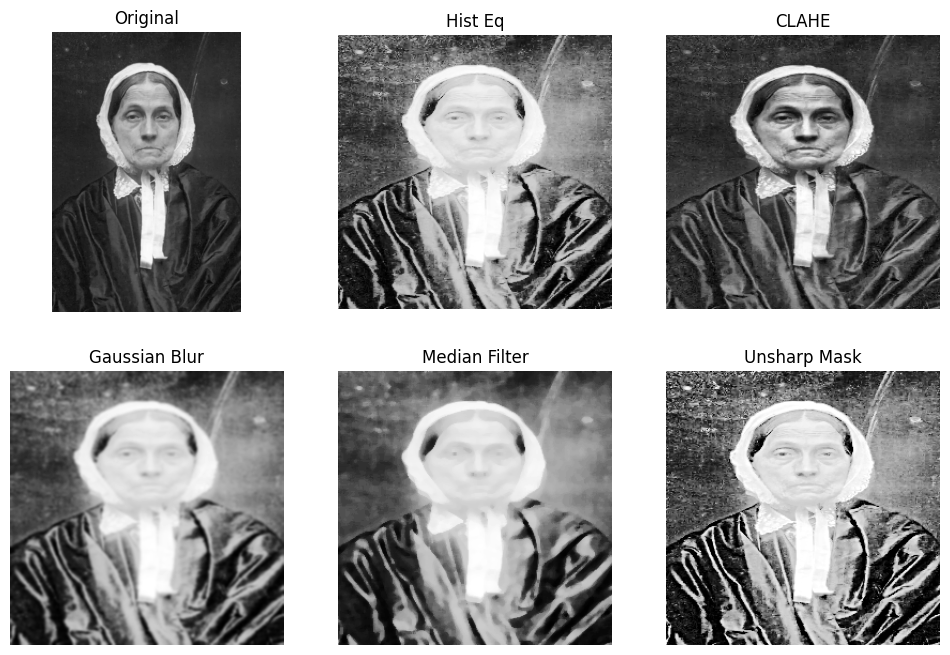

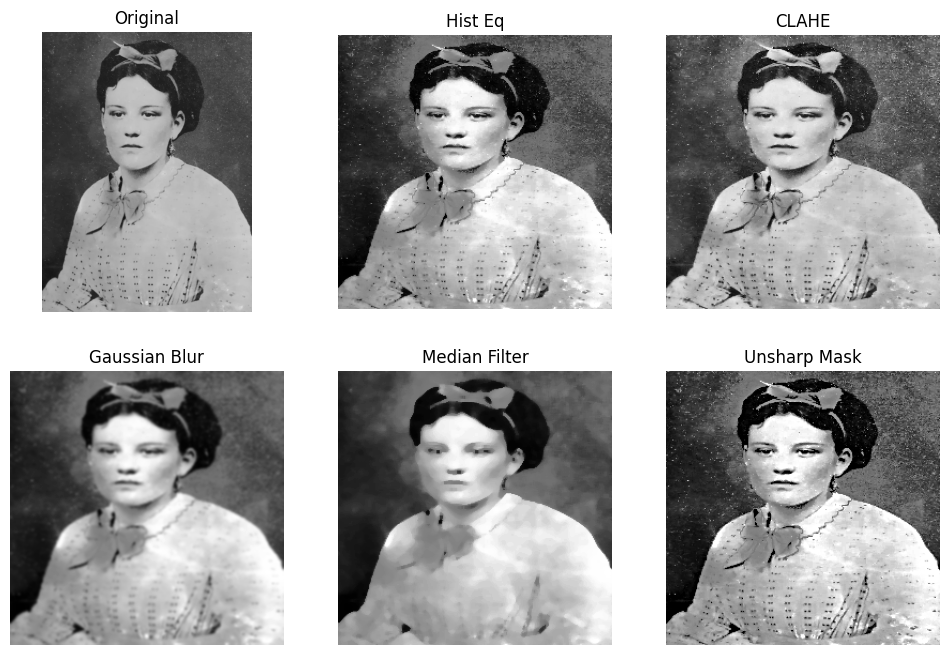

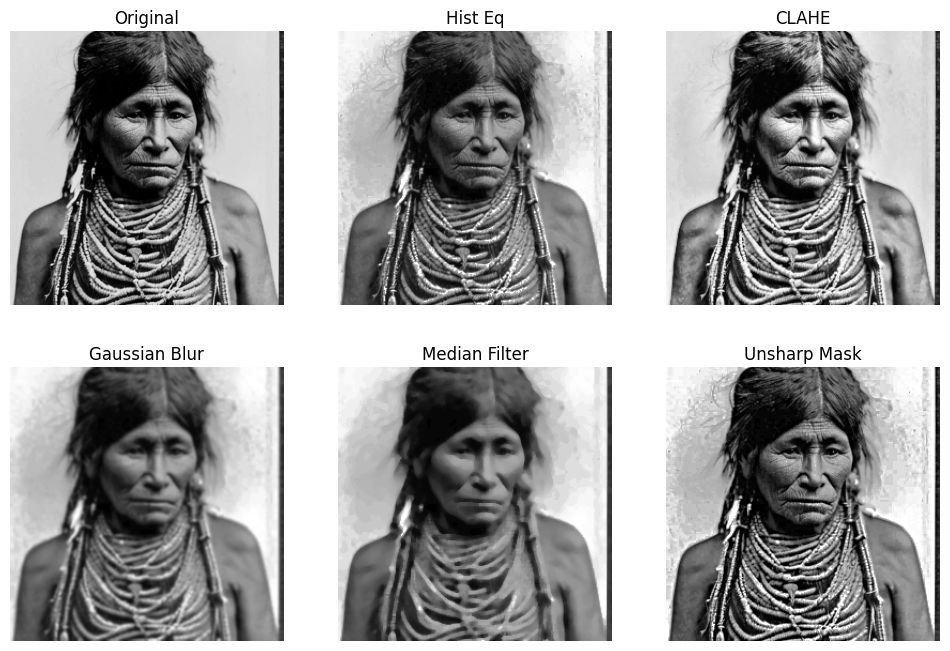

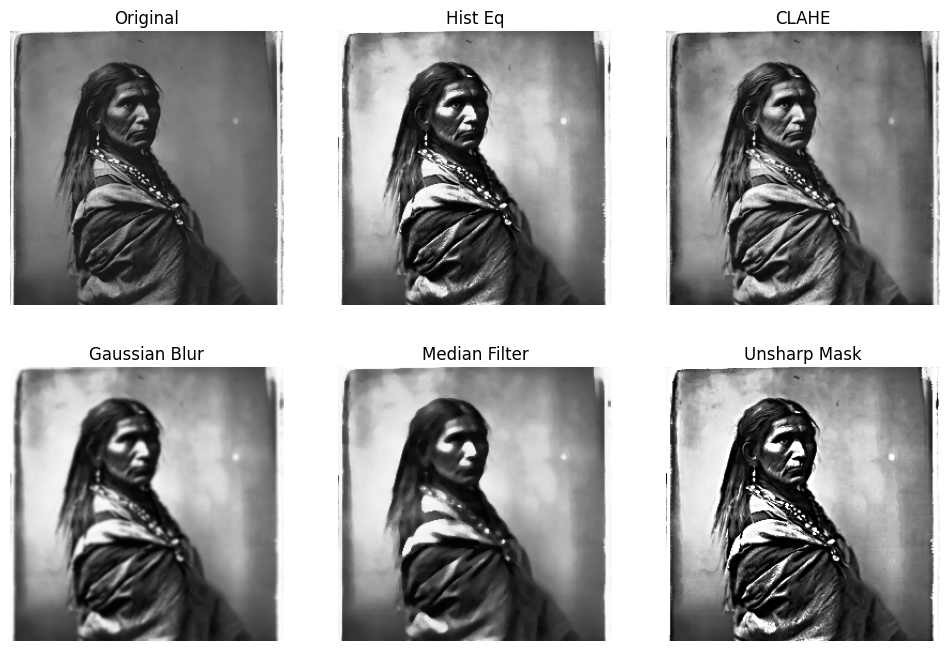

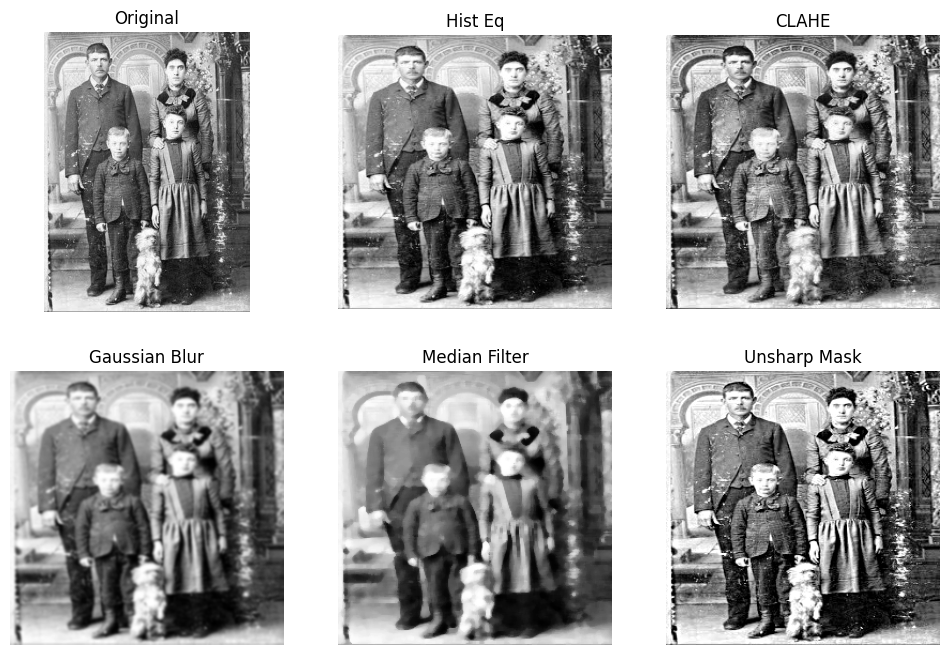

...

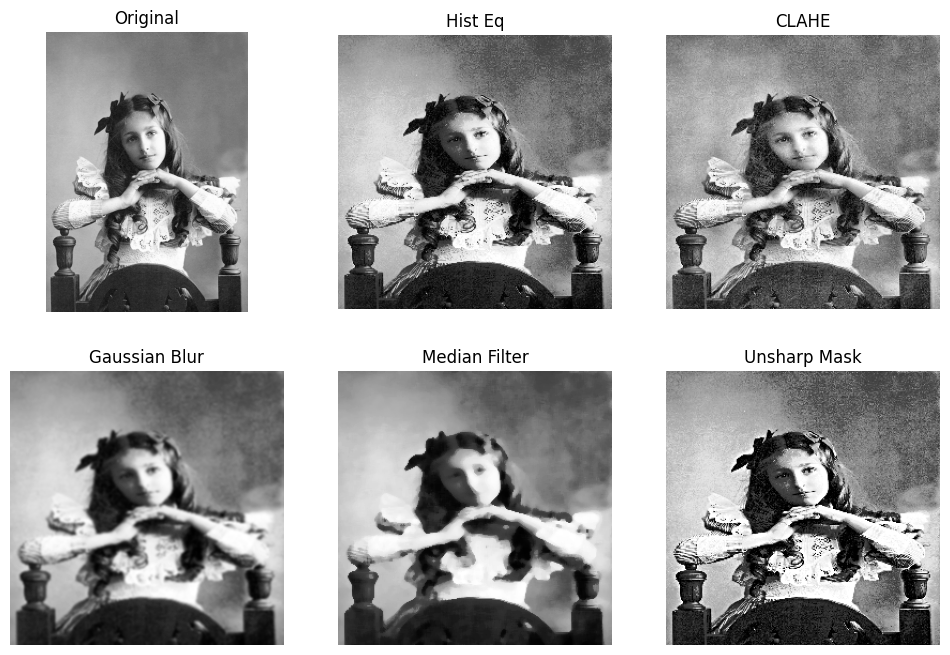

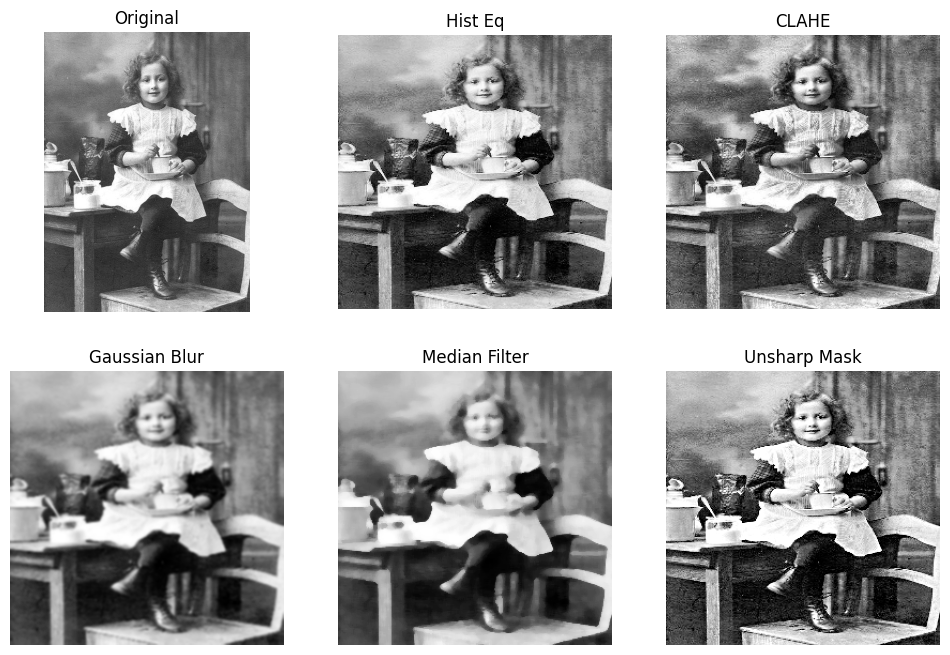

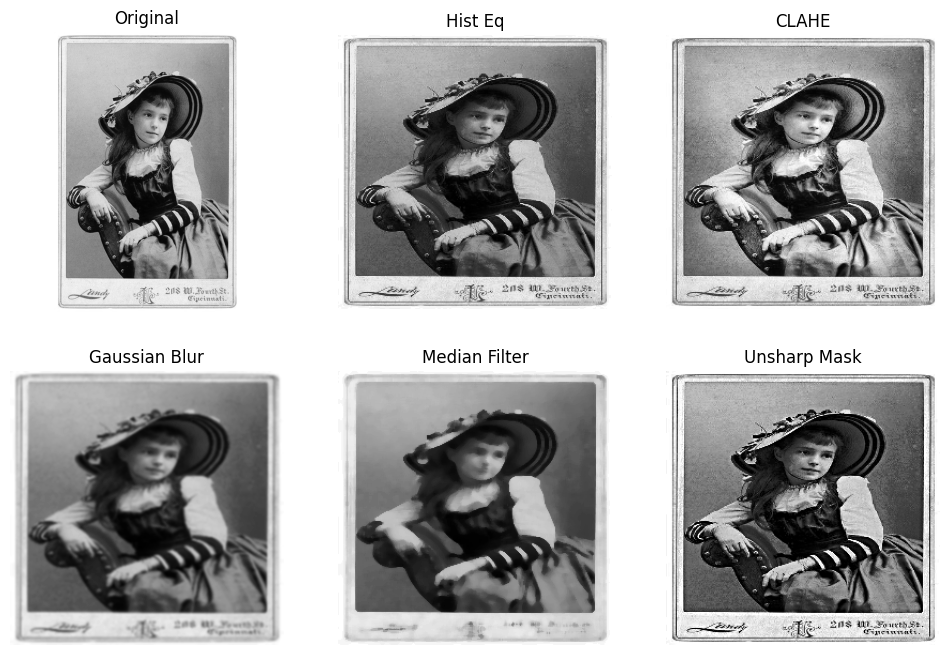

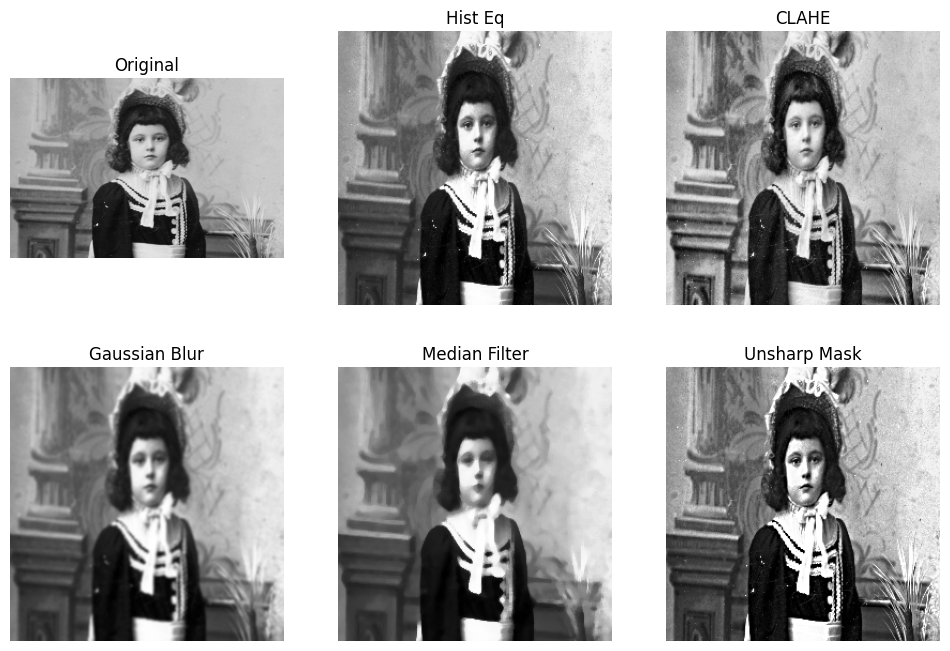

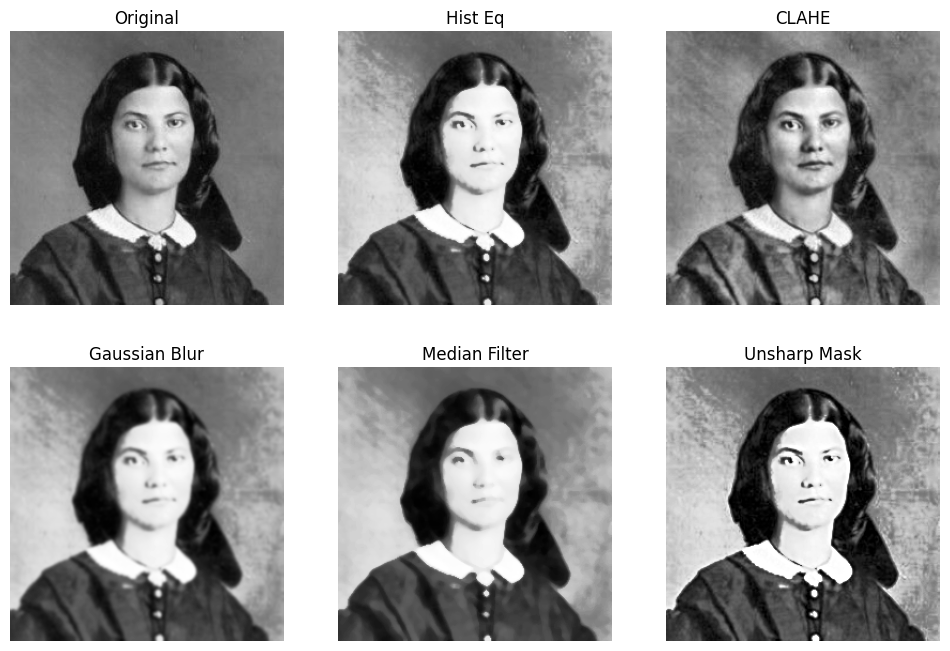

In [ ]:
path = os.path.join( "images")
images = os.listdir(path)

for img in images:
    # Paso 1: Carga y preprocesamiento
    img = cv2.imread(os.path.join(path, img))
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_resized = cv2.resize(img_gray, (256, 256))
    img_norm = img_resized / 255.0

    # Paso 2: Contraste (Histogram Equalization)
    hist_eq = cv2.equalizeHist((img_norm * 255).astype(np.uint8))

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_img = clahe.apply((img_norm * 255).astype(np.uint8))

    # Paso 3: Reducción de ruido
    gaussian_blur = cv2.GaussianBlur(hist_eq, (5,5), 0)
    median_filtered = cv2.medianBlur(hist_eq, 5)

    # Paso 4: Nitidez
    laplacian = cv2.Laplacian(gaussian_blur, cv2.CV_64F)
    unsharp_mask = cv2.addWeighted(hist_eq, 1.5, cv2.GaussianBlur(hist_eq, (9,9), 10), -0.5, 0)

    # Paso 5: Evaluación (SSIM, PSNR)
    ssim_gaussian = metrics.structural_similarity(hist_eq, gaussian_blur)
    psnr_gaussian = metrics.peak_signal_noise_ratio(hist_eq, gaussian_blur)

    # Visualización
    plt.figure(figsize=(12,8))
    plt.subplot(231); plt.title("Original"); plt.imshow(img_gray, cmap='gray'); plt.axis('off')
    plt.subplot(232); plt.title("Hist Eq"); plt.imshow(hist_eq, cmap='gray'); plt.axis('off')
    plt.subplot(233); plt.title("CLAHE"); plt.imshow(clahe_img, cmap='gray'); plt.axis('off')
    plt.subplot(234); plt.title("Gaussian Blur"); plt.imshow(gaussian_blur, cmap='gray'); plt.axis('off')
    plt.subplot(235); plt.title("Median Filter"); plt.imshow(median_filtered, cmap='gray'); plt.axis('off')
    plt.subplot(236); plt.title("Unsharp Mask"); plt.imshow(unsharp_mask, cmap='gray'); plt.axis('off')
    plt.show()
